In [9]:
import fwiVis.fwiVis as fv
import s3fs
s3 = s3fs.S3FileSystem(anon=False)
from math import cos, asin, sqrt
import re

import numpy as np
import geopandas as gpd
import pandas as pd
import datetime as dt
from matplotlib import pyplot as plt
import os
import rioxarray as rio
import xarray as xr
import rasterio
import glob
from geocube.api.core import make_geocube
from shapely.errors import ShapelyDeprecationWarning
from shapely.geometry import Point
from shapely.geometry import LineString
import warnings
import folium
from folium import plugins
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning) 


In [10]:

## Load up helper objects

files = s3.ls("s3://veda-data-store-staging/EIS/other/station-FWI/20000101.20220925.hrlyInterp/FWI/") # This will update through time. Not nessisary now because focus on 2019
st_id_map = pd.read_csv("/projects/my-public-bucket/fire_weather_vis/ref_data/isd-history.csv") ## For mappting ID's to lat lon

# Helper Variable
stations = fv.st_avail(files, st_id_map = st_id_map)
st_dict = stations[['Lat', 'Lon']].to_dict('records')
#stations

Searching for availible stations atveda-data-store-staging/EIS/other/station-FWI/20000101.20220925.hrlyInterp/FWI/


In [37]:
## Choose a fire


gdf = fv.load_large_fire('15418', year = "2019", path_region="WesternUS_REDO")
gdf.columns

In [40]:
gdf[gdf.n_newpixels > 0].t.max()

Timestamp('2019-10-28 12:00:00')

In [33]:
tmp = fv.prep_gdf(date = '20191031PM',layer='perimeter', path_region="WesternUS_REDO",handle_multi=False,only_lf=True,area_lim=5, year = "2019", crs = 'EPSG:4326')

/projects/old_shared/fire_weather_vis/base-fwi-vis/fwiVis/fwiVis.py:507: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_test['lon'] = gdf_test.centroid.x
/projects/old_shared/fire_weather_vis/base-fwi-vis/fwiVis/fwiVis.py:508: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_test['lat'] = gdf_test.centroid.y


In [34]:
tmp[tmp.farea > 5]

In [34]:
tmp[]

,isactive,isdead,t_inactive,isignition,mayreactivate,t,mergeid,ftype,n_pixels,n_newpixels,...,fperim,flinelen,duration,pixden,meanFRP,t_st,t_ed,geometry,lon,lat
fireID,,,,,,,,,,,,,,,,,,,,,
14363,0,0,12,0,1,2019-10-31 12:00:00,14363,4,4,0,...,13.659590,0.000000,1.0,0.616090,0.00,2019-10-18 00:00:00,2019-10-19 00:00:00,"POLYGON ((-101.42170 32.28775, -101.42169 32.2...",-101.416001,32.265148
8252,1,0,0,0,0,2019-10-31 12:00:00,8252,4,221,0,...,37.411500,0.000000,111.0,17.733349,0.00,2019-07-12 00:00:00,2019-10-31 00:00:00,"MULTIPOLYGON (((-102.13203 32.36643, -102.1320...",-102.127726,32.375081
2234,1,0,0,0,0,2019-10-31 12:00:00,2234,6,410,1,...,73.591001,2.089251,226.5,11.314235,4.11,2019-03-19 00:00:00,2019-10-31 12:00:00,"MULTIPOLYGON (((-101.94028 32.15010, -101.9403...",-101.953131,32.204467
12521,1,0,0,0,0,2019-10-31 12:00:00,12521,4,85,0,...,22.909562,0.000000,34.5,14.612271,0.00,2019-09-26 12:00:00,2019-10-31 00:00:00,"MULTIPOLYGON (((-101.89134 31.70157, -101.8913...",-101.901495,31.701758
14076,1,0,0,0,0,2019-10-31 12:00:00,14076,4,18,0,...,16.947040,0.000000,15.0,1.989653,0.00,2019-10-16 00:00:00,2019-10-31 00:00:00,"POLYGON ((-102.19501 32.18037, -102.19500 32.1...",-102.233128,32.173964
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15696,1,0,0,0,0,2019-10-31 12:00:00,15696,0,45,0,...,10.542589,0.000000,0.0,7.342038,0.00,2019-10-31 00:00:00,2019-10-31 00:00:00,"POLYGON ((-116.85983 32.54015, -116.85983 32.5...",-116.845433,32.552004
15418,1,0,3,0,0,2019-10-31 12:00:00,15418,4,40,0,...,9.269965,0.000000,0.5,6.314994,0.00,2019-10-28 00:00:00,2019-10-28 12:00:00,"POLYGON ((-118.49407 34.09935, -118.49400 34.0...",-118.480358,34.095498
10403,0,0,18,0,1,2019-10-31 12:00:00,10403,4,279,0,...,35.696974,0.000000,53.0,6.438198,0.00,2019-08-21 00:00:00,2019-10-13 00:00:00,"POLYGON ((-118.45966 34.34950, -118.45964 34.3...",-118.513703,34.320459


In [15]:
gdf = fv.load_large_fire('10510', year = "2019", path_region="WesternUS_REDO")
gdf.columns

['F10510']


/projects/old_shared/fire_weather_vis/base-fwi-vis/fwiVis/fwiVis.py:595: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['lon'] = gdf.centroid.x
/projects/old_shared/fire_weather_vis/base-fwi-vis/fwiVis/fwiVis.py:596: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['lat'] = gdf.centroid.y


Index(['n_pixels', 'n_newpixels', 'farea', 'fperim', 'flinelen', 'duration',
       'pixden', 'meanFRP', 't', 'geometry', 'lon', 'lat'],
      dtype='object')

In [12]:
fireID = '0'
gdf = fv.load_large_fire(fireID, year = "2021", path_region="Caldor")
gdf['timediff'] = gdf.t - pd.to_datetime("2021-08-14 18:00:00")
gdf['timediff'] = gdf.timediff.astype("int")
gdf["t"] = gdf["t"].astype("str")

gdf = gdf.sort_values(by = ["t"])
#gdf["t_st"] = gdf["t_st"].astype("str")
#gdf["t_ed"] = gdf["t_ed"].astype("str")

['F0']


/projects/old_shared/fire_weather_vis/base-fwi-vis/fwiVis/fwiVis.py:595: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['lon'] = gdf.centroid.x
/projects/old_shared/fire_weather_vis/base-fwi-vis/fwiVis/fwiVis.py:596: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['lat'] = gdf.centroid.y


In [13]:
gdf.columns

Index(['n_pixels', 'n_newpixels', 'farea', 'fperim', 'flinelen', 'duration',
       'pixden', 'meanFRP', 't', 'geometry', 'lon', 'lat', 'timediff'],
      dtype='object')

In [14]:
gdf.explore(column='timediff', #  cmap='RdBu_r', 
                  style_kwds={'fillOpacity':0})

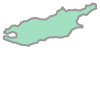

In [6]:
d = 135
gdf.iloc[d].geometry # Final perimeter

In [7]:
from shapely.geometry import Polygon, LineString

#polygon =  Polygon([(560023.4495758876400000, 6362057.3904932579000000),(560023.4495758876400000, 6362060.3904932579000000),(560024.4495758876400000, 6362063.3904932579000000),(560026.9495758876400000, 6362068.3904932579000000),(560028.4495758876400000, 6362069.8904932579000000),(560034.9495758876400000, 6362071.8904932579000000),(560036.4495758876400000, 6362071.8904932579000000),(560037.4495758876400000, 6362070.3904932579000000),(560037.4495758876400000, 6362064.8904932579000000),(560036.4495758876400000, 6362063.3904932579000000),(560034.9495758876400000, 6362061.3904932579000000),(560026.9495758876400000, 6362057.8904932579000000),(560025.4495758876400000, 6362057.3904932579000000),(560023.4495758876400000, 6362057.3904932579000000)])
polygon =  gdf.iloc[d].geometry 
# get the minimum bounding rectangle and zip coordinates into a list of point-tuples
#mbr_points = list(zip(*polygon.minimum_rotated_rectangle.exterior.coords.xy))

# calculate the length of each side of the minimum bounding rectangle
#mbr_lengths = [LineString((mbr_points[i], mbr_points[i+1])).length for i in range(len(mbr_points) - 1)]
#print("mbr lengths", mbr_lengths)
# get major/minor axis measurements
#minor_axis = min(mbr_lengths) ## not as usefull
#major_axis = max(mbr_lengths)


mrr = polygon.minimum_rotated_rectangle.exterior.coords.xy
print(mrr)
?polygon.minimum_rotated_rectangle.exterior.coords.xy

(array('d', [-120.55821686082055, -119.82366702783006, -119.90170968847224, -120.63625952146273, -120.55821686082055]), array('d', [38.473578674390794, 38.73952930005247, 38.95508142818987, 38.6891308025282, 38.473578674390794]))


Type:        property
String form: <property object at 0x7f0f6be53a90>
Docstring:   X and Y arrays


In [10]:
min_x = min(mrr[0]) 
print("min x : ", min_x)
min_y = min(mrr[1])
print("min y : ", min_y)

if(mrr[0][0] >  mrr[0][3]):
    start_x = min_x + (mrr[0][0] - mrr[0][3])*0.5
    print("+ slope")
else:
    start_x = max_x + (mrr[0][0] - mrr[0][3])*0.5 ## Negative slope case
    print("- slope")

#start_x = min_x + (mrr[0][0] - mrr[0][3])*0.5
start_y = min_y - (mrr[1][0] - mrr[1][3])*0.5


max_x = max(mrr[0])
print("max x", max_x)
max_y = max(mrr[1])
print("max y", max_y)

print(mrr)

if(mrr[0][0] >  mrr[0][3]):
    end_x = max_x - (mrr[0][0] - mrr[0][3])*0.5 ## Posative slope case
    print("+ slope")
else:
    end_x = min_x - (mrr[0][0] - mrr[0][3])*0.5 ## Nagative slope case
    print("- slope")

end_y = max_y + (mrr[1][0] - mrr[1][3])*0.5

start = Point(start_x, start_y)
end = Point(end_x, end_y)

center_line = LineString([start, end])
#print(center_line)
geocenter = gpd.GeoSeries(center_line)
#print(geocenter)

#min_x = min(mrr[0])
#min_y = min(mrr[1])
#start_x = mrr[0][0] + (mrr[0][0] - mrr[0][2])*0.5
#start_y = mrr[1][0] - ((mrr[1][0] - mrr[1][2])*0.5)

#max_x = max(mrr[0])
#max_y = max(mrr[1])

#end_x = mrr[0][1] + (mrr[0][1] - mrr[0][3])*0.5
#end_y = mrr[1][1] - ((mrr[1][1] - mrr[1][3])*0.5)

#start = Point(start_x, start_y)
#end = Point(end_x, end_y)

#center_line = LineString([start, end])
#print(center_line)
#geocenter = gpd.GeoSeries(center_line)
#print(geocenter)

min x :  -120.63625952146273
min y :  38.473578674390794
+ slope
max x -119.82366702783006
max y 38.95508142818987
(array('d', [-120.55821686082055, -119.82366702783006, -119.90170968847224, -120.63625952146273, -120.55821686082055]), array('d', [38.473578674390794, 38.73952930005247, 38.95508142818987, 38.6891308025282, 38.473578674390794]))
+ slope
LINESTRING (-120.59723819114164 38.581354738459495, -119.86268835815115 38.84730536412117)


mrr XY coords: (array('d', [-120.55821686082055, -119.82366702783006, -119.90170968847224, -120.63625952146273, -120.55821686082055]), array('d', [38.473578674390794, 38.73952930005247, 38.95508142818987, 38.6891308025282, 38.473578674390794]))


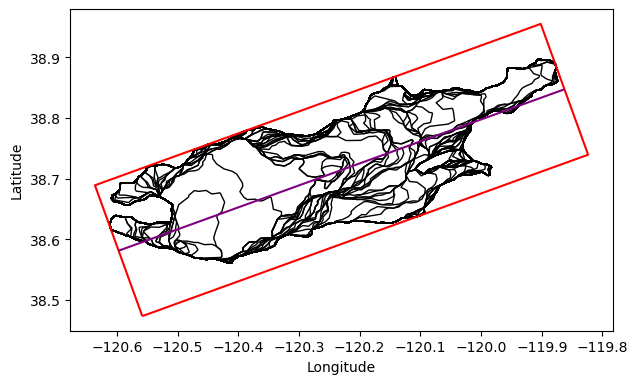

In [14]:
print("mrr XY coords:", polygon.minimum_rotated_rectangle.exterior.coords.xy)
rect = gpd.GeoSeries(polygon.minimum_rotated_rectangle.exterior)


rect_shifted = rect.translate(xoff = (mrr[0][0] - mrr[0][3])*0.5 , yoff = (mrr[1][0] - mrr[1][3]) * 0.5)

#print(minor_axis)
#major_axis


fig, ax = fig, ax = plt.subplots(figsize=(7,7))

gdf.plot(ax=ax, facecolor="None", edgecolor='k',alpha=1,linewidth=1)
rect.plot(ax=ax, color='red', markersize=5);
#rect_shifted.plot(ax=ax, color='blue', markersize=5);
#ax.plot(center_line.xy)
geocenter.plot(ax=ax, color = "purple", markersize=5)
ax.set_xlabel('Longitude', fontsize=10)
ax.set_ylabel('Latitude', fontsize='medium')

#rect.plot()
#gdf.plot()
plt.show()

In [493]:
type(geocenter)

geopandas.geoseries.GeoSeries

In [112]:
### Make into a fucntion 
# provide polygon, get center line
def major_ax(polygon):
    mrr = polygon.minimum_rotated_rectangle.exterior.coords.xy
    min_x = min(mrr[0]) #min_x = min(np.abs(mrr[0])) * -1
    min_y = min(mrr[1])

    max_x = max(mrr[0])
    max_y = max(mrr[1])
    
    #start_x = min_x + (mrr[0][0] - mrr[0][3])*0.5
    if(mrr[0][0] >  mrr[0][3]):
        start_x = min_x + (mrr[0][0] - mrr[0][3])*0.5
    else:
        start_x = max_x + (mrr[0][0] - mrr[0][3])*0.5 ## Negative slope case

    #start_x = min_x + (mrr[0][0] - mrr[0][3])*0.5
    start_y = min_y - (mrr[1][0] - mrr[1][3])*0.5




    end_x = max_x - (mrr[0][0] - mrr[0][3])*0.5 ## Posative slope case
    if(mrr[0][0] >  mrr[0][3]):
        end_x = max_x - (mrr[0][0] - mrr[0][3])*0.5 ## Posative slope case
    else:
        end_x = min_x - (mrr[0][0] - mrr[0][3])*0.5 ## Nagative slope case

    end_y = max_y + (mrr[1][0] - mrr[1][3])*0.5
    
    start = Point(start_x, start_y)
    end = Point(end_x, end_y)
    
    center_line = LineString([start, end])

    #geocenter = gpd.GeoSeries(center_line)
    return(center_line)
    
def start_major_ax(start_point, polygon):
    mrr = polygon.minimum_rotated_rectangle.exterior.coords.xy

    max_x = max(np.abs(mrr[0])) * -1 #max_x = max(mrr[0])
    max_y = max(mrr[1])
    
    min_x = min(np.abs(mrr[0])) * -1 #min_x = min(mrr[0]) 
    min_y = min(mrr[1])
    
    #end_x = max_x - (mrr[0][0] - mrr[0][3])*0.5 ## Posative slope case
    end_x = min_x - (mrr[0][0] - mrr[0][3])*0.5 ## Nagative slope case
   # if(mrr[0][0] >  mrr[0][3]):
   #     end_x = max_x - (mrr[0][0] - mrr[0][3])*0.5 ## Posative slope case
   # else:
#         end_x = min_x - (mrr[0][0] - mrr[0][3])*0.5 ## Nagative slope case
        
    end_y = max_y + (mrr[1][0] - mrr[1][3])*0.5

    #start = Point(start_x, start_y)
    end = Point(end_x, end_y)

    center_line = LineString([start_point, end])
    #geocenter = gpd.GeoSeries(center_line)
    #return(geocenter)
    return(center_line)

In [113]:
## Try getting all center lines for each day
#gdf = gpd.GeoDataFrame(pd.concat([gpd.read_file(i).to_crs(gpd.read_file(path[0]).crs) for i in path], 
 #                       ignore_index=True), crs=gpd.read_file(path[0]).crs)



#lines = gpd.GeoDataFrame(ge)
#lines["geometry"] = major_ax(gdf.iloc[0].geometry)
#lines = major_ax(gdf.iloc[0].geometry)

start_point = gdf.centroid.iloc[0]
print(start_point)
gdf["centerline"] = np.nan
for i in range(0,135):
    #print(i)
    line = major_ax(gdf.iloc[i].geometry)
    #print(line)
    gdf.centerline.iloc[i] = line

gdf["from_start_line"] = np.nan
for i in range(0,135):
    #print(i)
    line = start_major_ax(start_point, gdf.iloc[i].geometry)
    #print(line)
    gdf.from_start_line.iloc[i] = line

/tmp/ipykernel_728/968400715.py:11: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  start_point = gdf.centroid.iloc[0]
/tmp/ipykernel_728/968400715.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdf.centerline.iloc[i] = line


POINT (-120.49549053373258 38.590483176809244)


/tmp/ipykernel_728/968400715.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdf.from_start_line.iloc[i] = line


In [114]:
#gdf[0:4].geometry.plot()
#gc[0:1].centerline

In [115]:
gc = gdf
gf = gdf
type(gc.centerline)
#gc=gc[gc.centerline.notna()]
#print(gc.centerline)
gc = gc.set_geometry(col = "centerline")
gf = gf.set_geometry(col = "from_start_line")

type(gf.geometry)

geopandas.geoseries.GeoSeries

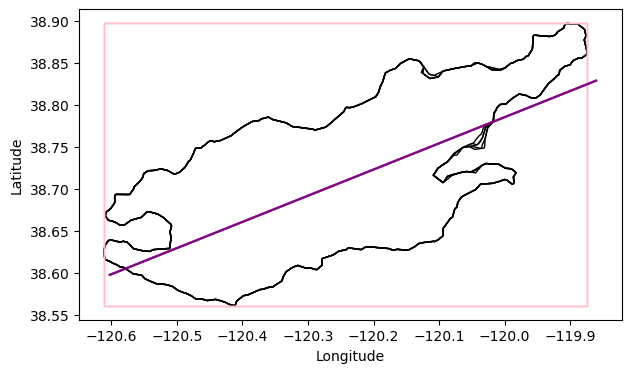

In [117]:
d1 = 45
d2  = 50

fig, ax = fig, ax = plt.subplots(figsize=(7,7))
gdf[d1:d2].plot(ax=ax, facecolor="None", edgecolor='k',alpha=1,linewidth=1)
gc[d1:d2].plot(ax=ax, color = "purple",  markersize=5, alpha = 0.5)
#gf[d1:d2].plot(ax=ax, color = "blue",  markersize=5, alpha = 0.4 )
gdf[d1:d2].geometry.envelope.plot(ax = ax, facecolor="None", edgecolor = "pink", alpha = 0.6 )
ax.set_xlabel('Longitude', fontsize=10)
ax.set_ylabel('Latitude', fontsize='medium')
plt.show()

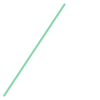

In [96]:
gdf.centerline[0]

## gdf = fv.load_large_fire(fireID, year = "2021", path_region="Caldor")

In [78]:
## Get that fire lat lon

foi = gdf
foi = foi.rename(columns = {"lat": "Lat", "lon": "Lon"})
foi = foi.iloc[0] # First element
print(foi["Lat"])
foi["Lon"]

38.62358143406725


-120.46449754031126

In [79]:
## Look for closest station
st_cls = fv.closest(st_dict, foi)

The closest station is 90.61358917004267 km away.


In [80]:
## Get station Data
st = fv.get_st(lat = st_cls["Lat"], lon = st_cls["Lon"], stations = stations)

/projects/my-public-bucket/fire_weather_vis/base-fwi-vis/fwiVis/fwiVis.py:127: ParserWarning: Length of header or names does not match length of data. This leads to a loss of data with index_col=False.
  dat = pd.read_csv(("s3://" + st.File_path.iloc[0]), index_col = False)


In [81]:
## Merge with fire data
gdf.set_index("t")
#gdf.sort_values(by = "t")
#gdf.t = gdf.t.astype('datetime64[ns]')


full_fr = fv.fr_st_merge(gdf, st, sub = True)

full_fr = full_fr.sort_values(by = ['t']) ## Need to sort or timeseries jumps around
full_fr['t'] = full_fr['t'].astype('datetime64[ns]')


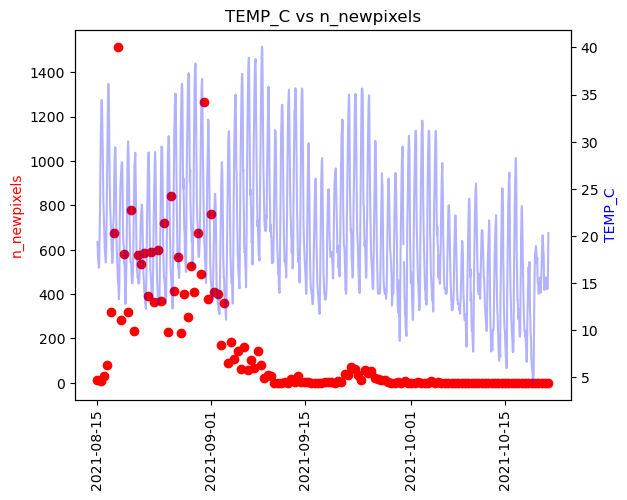

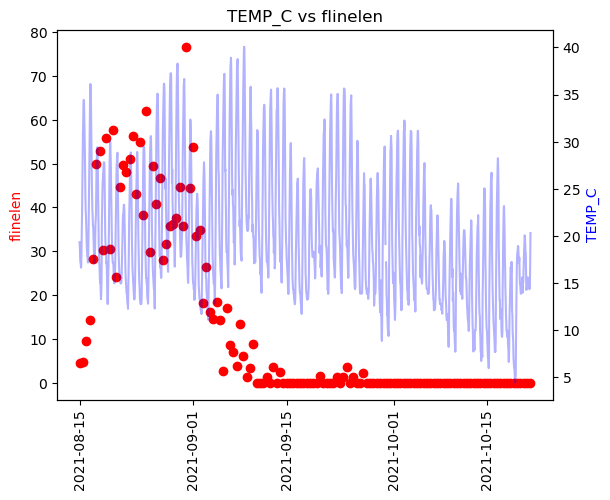

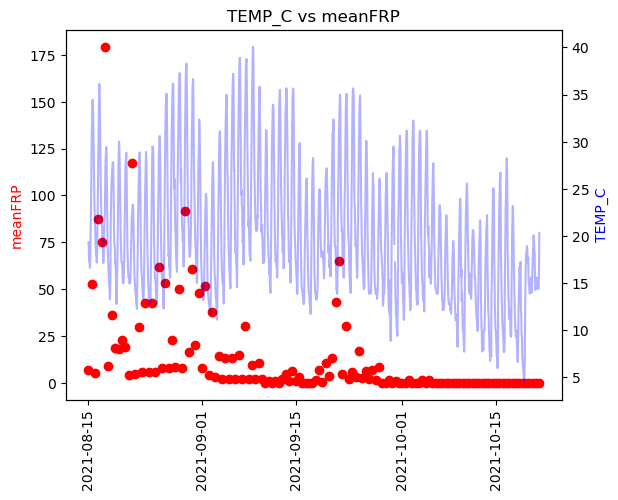

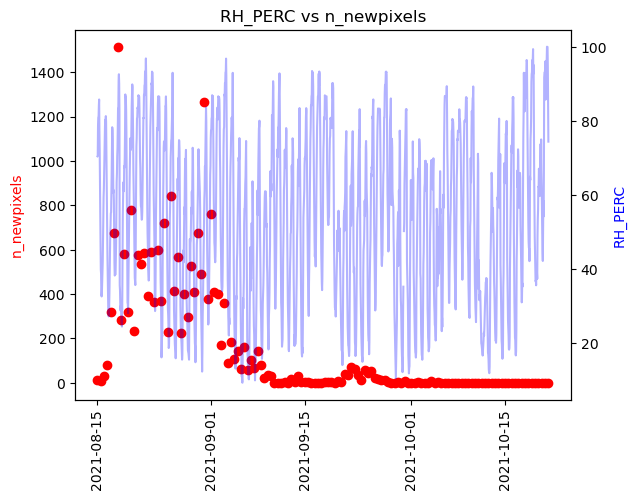

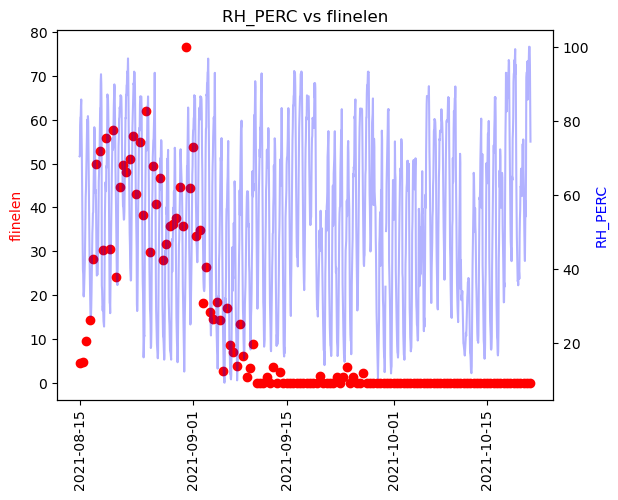

...

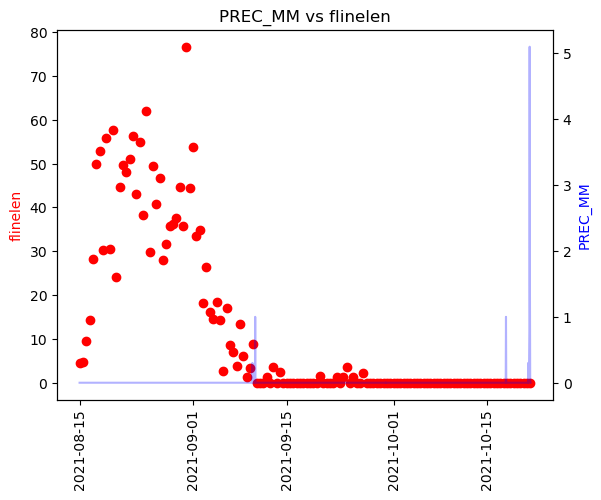

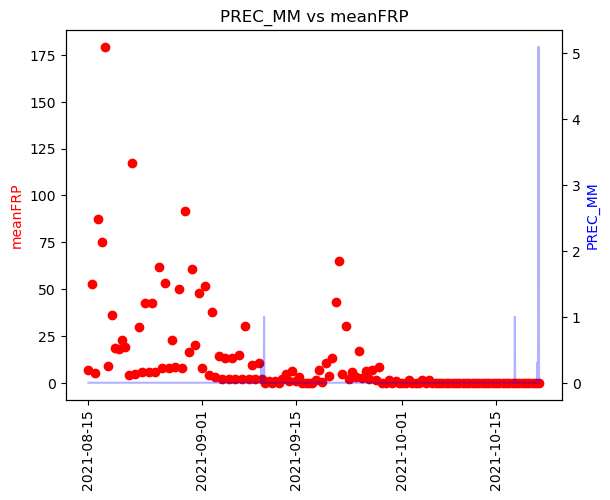

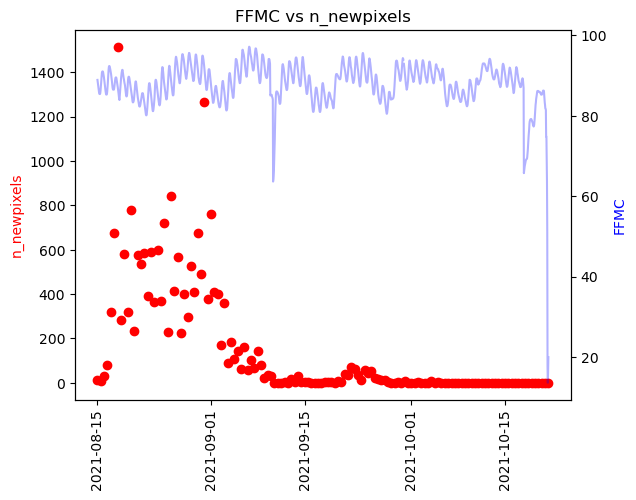

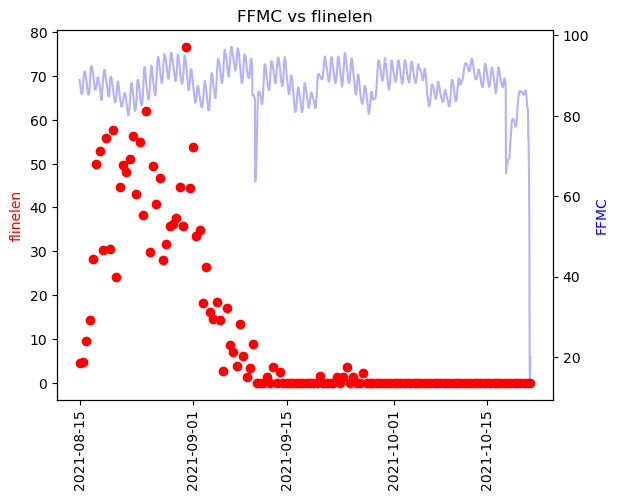

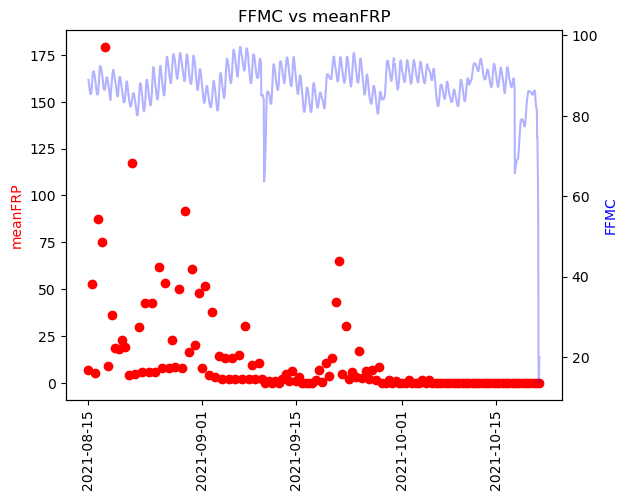

In [82]:
## Plot 

met = ['TEMP_C', 'RH_PERC', ' VPD_HPA', 'WDSPD_KPH',
       'FWI', 'PREC_MM', 'FFMC']  ## Station Data Columns to Plot
fire = [ 'n_newpixels', 'flinelen','meanFRP',] ## gdf columns to plot

#n_met = len(met)
#n_fire = len(fire)

for m in met:
    for f in fire:
        fig, ax = plt.subplots()
        
        ax.scatter(full_fr["t"], full_fr[f], color = "r")
        #ax.plot(full_fr["t"], full_fr[m])
        #plt.xticks(rotation = 90)   
        ax.set_title(m + " vs " +  f)
        ax.set_ylabel(f, color = "red")
        ax2=ax.twinx()
        ax2.plot(full_fr["t"], full_fr[m],color="blue",  alpha=0.3)
        ax2.set_ylabel(m,color="blue")
        ax.tick_params(axis='x', labelrotation = 90)

        plt.show()

In [58]:
#import hvplot ## Need to have the extension going, and be on docker for this to work. 
#import hvplot as hv

In [97]:
long_time = fv.fr_st_merge(gdf, st, sub = False) # Get full station timeseries 
long_time = long_time.set_index("t")

In [18]:
#long_time.columns

In [19]:
#import hvplot.pandas
#import holoviews as hv
#import hvplot.geoviews

#pd.options.plotting.backend = 'holoviews'
#hvplot.extension('bokeh')
#hv.extension('bokeh')
#hv.extension('matplotlib')
#hvplot.extension('matplotlib')

In [20]:
#tmp = long_time[[ "FWI", "flinelen", "meanFRP", ' VPD_HPA', 'RH_PERC', 'TEMP_C', 'WDSPD_KPH']]
#tmp = tmp[np.isfinite(tmp)]
#meanFRP = tmp[np.isfinite(tmp.meanFRP)]
#flinelen = tmp[np.isfinite(tmp.flinelen)]

#long_time.hvplot( y = "FWI")

In [21]:
#tmp.hvplot()

In [22]:
#flinelen.hvplot.scatter( y='flinelen', color = "red", yaxis = "left") * tmp.hvplot.line(y = "FWI", yaxis = "right") 

In [23]:
# No HVplot

In [24]:
#mid_fire


In [98]:
full_fr["fwi_anom"] = full_fr["FWI"] - np.mean(long_time.FWI)


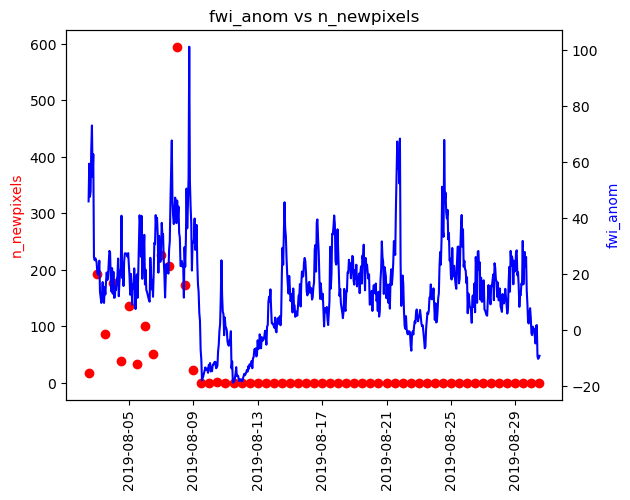

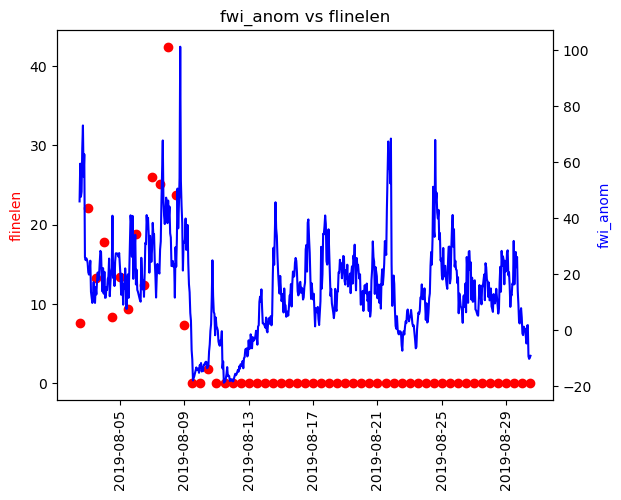

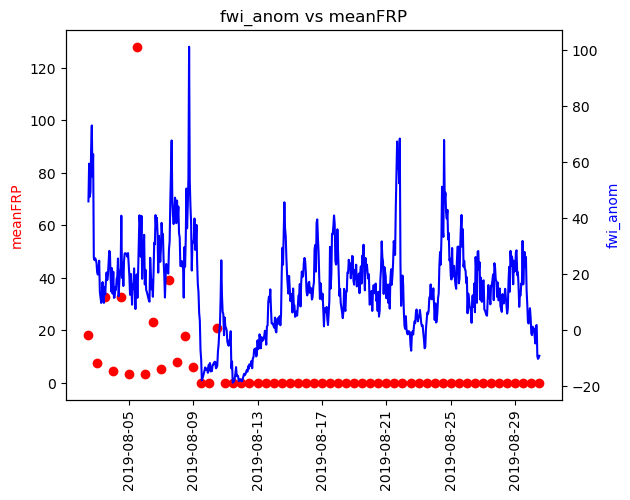

In [99]:
#tmp_fire = long_fire[]

met = ["fwi_anom"]  ## Station Data Columns to Plot
fire = [ 'n_newpixels', 'flinelen','meanFRP',] ## gdf columns to plot


for m in met:
    for f in fire:
        fig, ax = plt.subplots()
        
        ax.scatter(full_fr["t"], full_fr[f], color = "r")
        #ax.plot(full_fr["t"], full_fr[m])
        #plt.xticks(rotation = 90)   
        ax.set_title(m + " vs " +  f)
        ax.set_ylabel(f, color = "red")
        ax2=ax.twinx()
        ax2.plot(full_fr["t"], full_fr[m],color="blue")
        ax2.set_ylabel(m,color="blue")
        ax.tick_params(axis='x', labelrotation = 90)

        plt.show()

In [100]:
# Plotting a month beforehand 
import datetime as dt

In [101]:
#st_dat = dat[(dat.time >= min(gdf.t)) &  (dat.time <= max(gdf.t))]

start_date = min(full_fr["t"])
print(start_date)

month_early = start_date - np.timedelta64(5, 'M')
month_early

2019-08-02 12:00:00


Timestamp('2019-03-03 07:34:30')

In [102]:
mid_fire = fv.fr_st_merge(gdf, st, sub = True, sub_type = "month_before", num_months= 1)

ConversionError: Failed to convert value(s) to axis units: '2020-09-06 00:30:00'

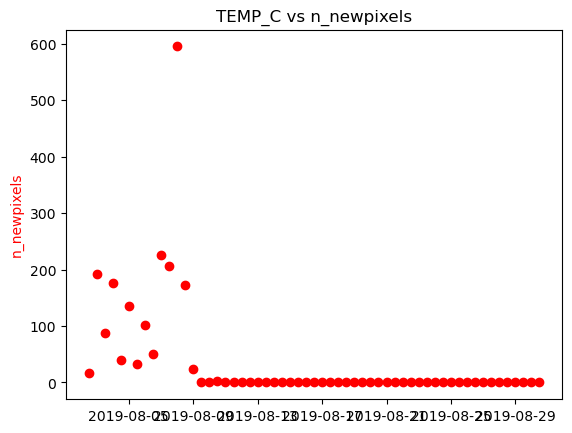

In [103]:
met = ['TEMP_C', 'RH_PERC', ' VPD_HPA', 'WDSPD_KPH',
       'FWI', 'PREC_MM']  ## Station Data Columns to Plot
fire = [ 'n_newpixels', 'flinelen','meanFRP',] ## gdf columns to plot



for m in met:
    for f in fire:
        fig, ax = plt.subplots()
        
        ax.scatter(mid_fire["t"], mid_fire[f], color = "r")
        #ax.plot(full_fr["t"], full_fr[m])
        #plt.xticks(rotation = 90)   
        ax.set_title(m + " vs " +  f)
        ax.set_ylabel(f, color = "red")
        ax.axvline(x="2020-09-06 00:30:00", ymin=0, ymax=3000, color = "orange")
        ax.axvline(x="2020-09-06 12:30:00", ymin=0, ymax=3000, color = "orange")
        ax2=ax.twinx()
        ax2.plot(mid_fire["t"], mid_fire[m],color="blue",  alpha=0.3)
        ax2.set_ylabel(m,color="blue")
        ax.tick_params(axis='x', labelrotation = 90)

        plt.show()
        
        

ConversionError: Failed to convert value(s) to axis units: '2020-09-06 00:30:00'

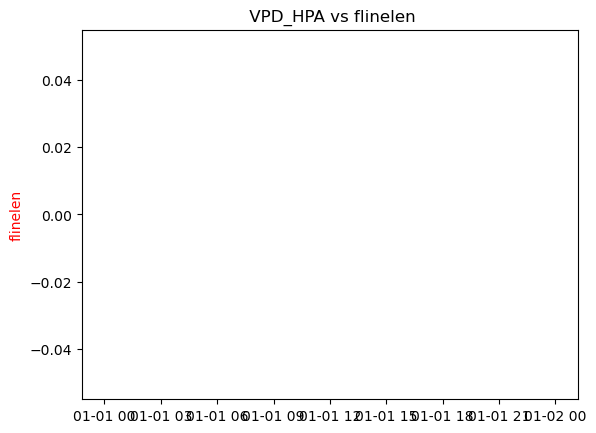

In [104]:
creek_fire  = mid_fire[(mid_fire["t"] >= "2020-09-01 00:00:00")]
#creek_fire  = mid_fire[(mid_fire["t"] >= "2020-09-01 00:00:00") & (mid_fire["t"] <= "2020-09-15 00:00:00")]

met = [
       ' VPD_HPA']  ## Station Data Columns to Plot
fire = ['flinelen','meanFRP',] ## gdf columns to plot
#fire = ['flinelen']
#fire = ['meanFRP']

for m in met:
    for f in fire:
        fig, ax = plt.subplots()
        
        ax.scatter(creek_fire["t"], creek_fire[f], color = "r")
        #ax.plot(full_fr["t"], full_fr[m])
        #plt.xticks(rotation = 90)   
        ax.set_title(m + " vs " +  f)
        ax.set_ylabel(f, color = "red")
        ax.axvline(x="2020-09-06 00:30:00", ymin=0, ymax=3000, color = "orange")
        ax.axvline(x="2020-09-06 12:30:00", ymin=0, ymax=3000, color = "orange")
        ax2=ax.twinx()
        ax2.plot(creek_fire["t"], creek_fire[m],color="blue",  alpha=0.3)
        ax2.set_ylabel(m,color="blue")
        ax.tick_params(axis='x', labelrotation = 90)

        plt.show()

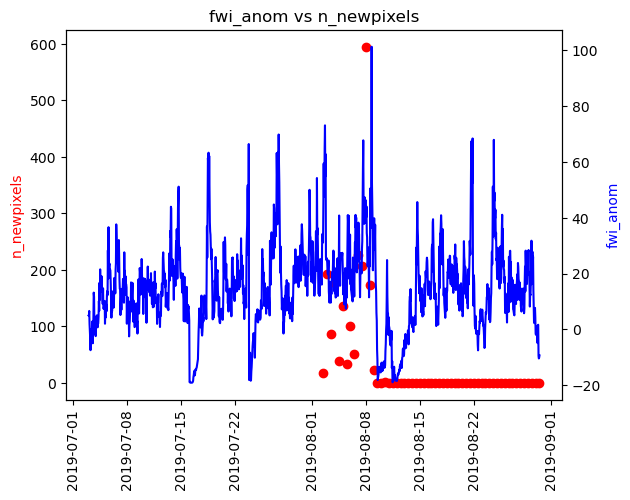

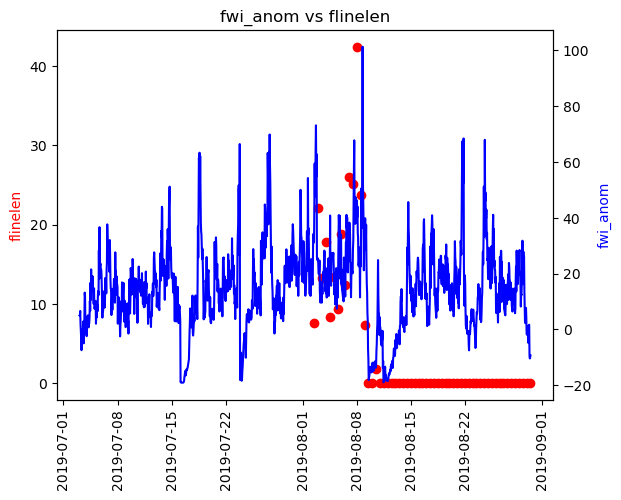

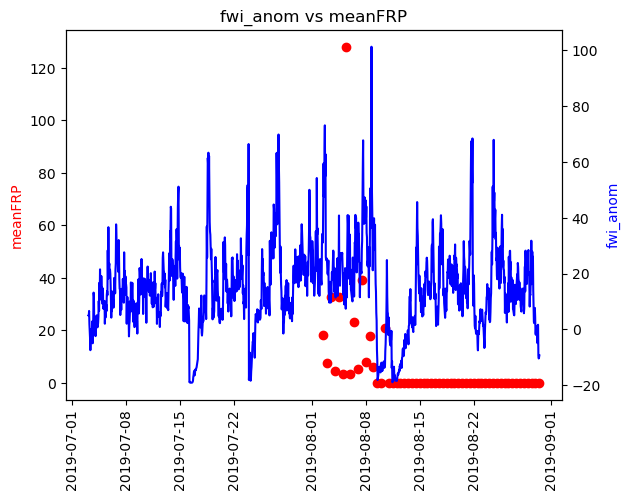

In [105]:
# look at anomolies

mid_fire["fwi_anom"] = mid_fire["FWI"] - np.mean(long_time.FWI)


met = ["fwi_anom"]  ## Station Data Columns to Plot
fire = [ 'n_newpixels', 'flinelen','meanFRP',] ## gdf columns to plot



for m in met:
    for f in fire:
        fig, ax = plt.subplots()
        
        ax.scatter(mid_fire["t"], mid_fire[f], color = "r")
        #ax.plot(full_fr["t"], full_fr[m])
        #plt.xticks(rotation = 90)   
        ax.set_title(m + " vs " +  f)
        ax.set_ylabel(f, color = "red")
        ax2=ax.twinx()
        ax2.plot(mid_fire["t"], mid_fire[m],color="blue")
        ax2.set_ylabel(m,color="blue")
        ax.tick_params(axis='x', labelrotation = 90)

        plt.show()


In [106]:
# Explanatory variables


exp = fv.fr_st_merge(gdf, st)
exp

,n_pixels,n_newpixels,farea,fperim,flinelen,duration,pixden,meanFRP,t,geometry,...,DC,BUI,ISI,FWI,OBSMINUTEDIFFTEMP,OBSMINUTEDIFFRH,OBSMINUTEDIFFWDSPD,OBSMINUTEDIFFPREC,OBSMINUTEDIFFSNOW,HH_format
8,17.0,17.0,2.991894,7.507975,7.507975,0.0,5.682019,18.326471,2019-08-02 12:00:00,"POLYGON ((-118.57549 47.95257, -118.57572 47.9...",...,628.69,157.71,24.2460,64.9260,7.0,7.0,7.0,7,NaN,12
57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-08-02 13:00:00,None,...,NaN,NaN,33.2560,78.4140,0.0,0.0,0.0,0,NaN,13
58,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-08-02 14:00:00,None,...,NaN,NaN,25.2820,66.5870,7.0,7.0,7.0,7,NaN,14
59,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-08-02 15:00:00,None,...,NaN,NaN,26.4240,68.3790,7.0,7.0,7.0,7,NaN,15
60,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-08-02 16:00:00,None,...,NaN,NaN,37.2280,83.7900,0.0,0.0,0.0,0,NaN,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
669,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-08-30 08:00:00,None,...,NaN,NaN,3.9633,20.7420,7.0,7.0,7.0,7,NaN,08
670,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-08-30 09:00:00,None,...,NaN,NaN,1.4644,9.5784,7.0,7.0,7.0,7,NaN,09
671,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-08-30 10:00:00,None,...,NaN,NaN,1.3052,8.6800,0.0,0.0,0.0,0,NaN,10
672,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-08-30 11:00:00,None,...,NaN,NaN,1.3712,9.0568,7.0,7.0,7.0,7,NaN,11


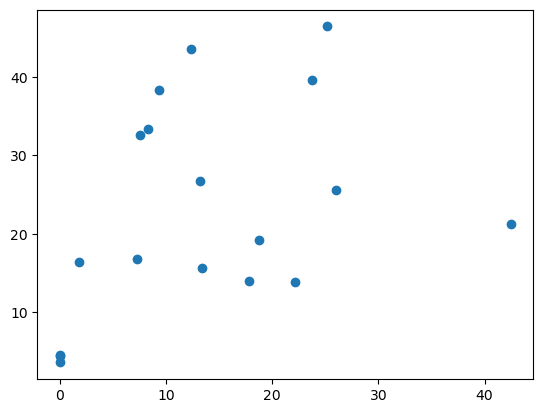

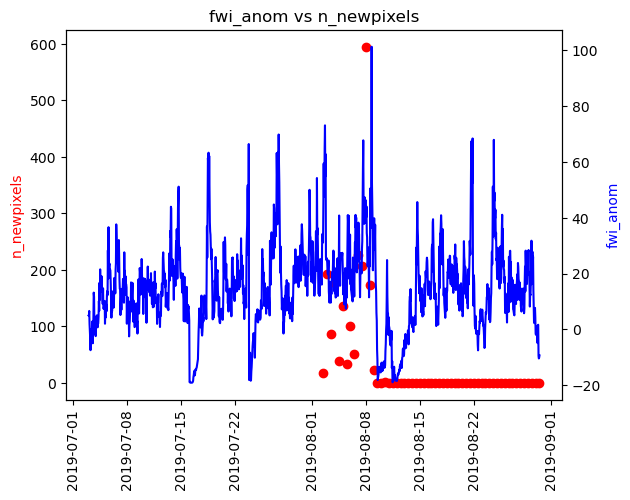

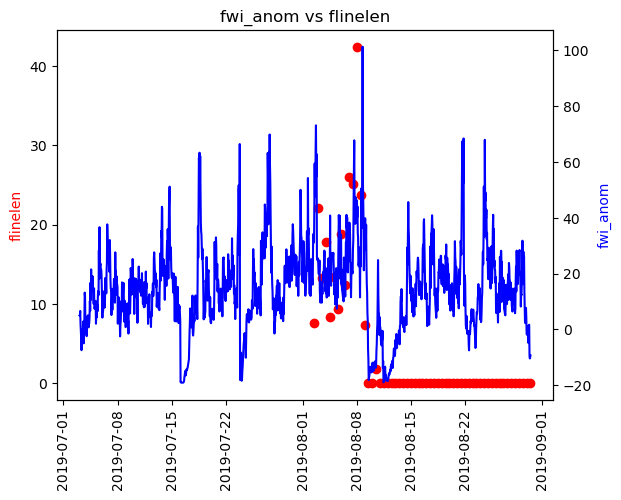

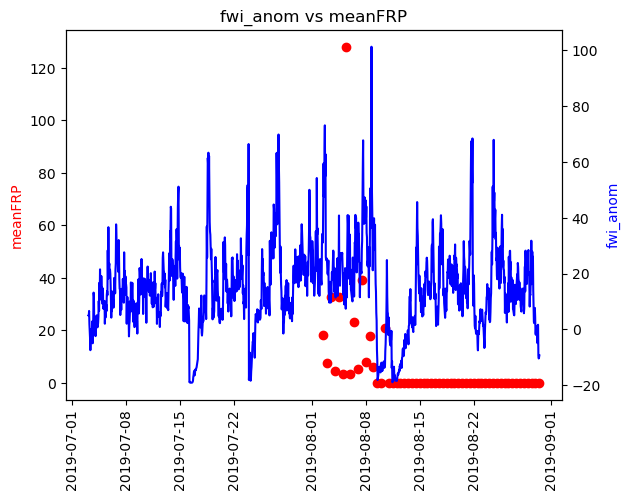

In [107]:
exp = exp[exp.t < "2019-08-11 12:00:00"]
exp.columns

plt.scatter(x = exp.flinelen, y = exp[' VPD_HPA'])

met = ["fwi_anom"]  ## Station Data Columns to Plot
fire = [ 'n_newpixels', 'flinelen','meanFRP',] ## gdf columns to plot



for m in met:
    for f in fire:
        fig, ax = plt.subplots()
        
        ax.scatter(mid_fire["t"], mid_fire[f], color = "r")
        #ax.plot(full_fr["t"], full_fr[m])
        #plt.xticks(rotation = 90)   
        ax.set_title(m + " vs " +  f)
        ax.set_ylabel(f, color = "red")
        ax2=ax.twinx()
        ax2.plot(mid_fire["t"], mid_fire[m],color="blue")
        ax2.set_ylabel(m,color="blue")
        ax.tick_params(axis='x', labelrotation = 90)

        plt.show()

/projects/myenvs/fireatlas_oct4/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            AutoReg Model Results                             
==============================================================================
Dep. Variable:                    FWI   No. Observations:                  216
Model:                     AutoReg(3)   Log Likelihood                -760.245
Method:               Conditional MLE   S.D. of innovations              8.587
Date:                Mon, 07 Nov 2022   AIC                           1530.490
Time:                        17:32:32   BIC                           1547.296
Sample:                             3   HQIC                          1537.282
                                  216                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.8453      1.355      2.099      0.036       0.189       5.502
FWI.L1         0.7062      0.069     10.292      0.000       0.572       0.841
FWI.L2         0.2394      0.082      2.930      0.003       0.079       0.400
FWI.L3        -0.0298      0.068     -0.437      0.662      -0.164       0.104
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.0761           +0.0000j            1.0761            0.0000
AR.2           -3.1003           +0.0000j            3.1003            0.5000
AR.3           10.0517           +0.0000j           10.0517            0.0000
-----------------------------------------------------------------------------
"""

In [40]:
import seaborn as sns ## I mannually conda installed these into the fireatlas env. Will need to be reinstalled.
import statsmodels.api as sm
from statsmodels.tsa.api import acf, graphics, pacf
from statsmodels.tsa.ar_model import AutoReg, ar_select_order

In [39]:
mod = AutoReg(exp.FWI, 3)
res = mod.fit()
res.summary()

/projects/myenvs/fireatlas_oct4/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            AutoReg Model Results                             
==============================================================================
Dep. Variable:                    FWI   No. Observations:                  216
Model:                     AutoReg(3)   Log Likelihood                -760.245
Method:               Conditional MLE   S.D. of innovations              8.587
Date:                Mon, 07 Nov 2022   AIC                           1530.490
Time:                        17:42:57   BIC                           1547.296
Sample:                             3   HQIC                          1537.282
                                  216                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.8453      1.355      2.099      0.036       0.189       5.502
FWI.L1         0.7062      0.069     10.292      0.000       0.572       0.841
FWI.L2         0.2394      0.082      2.930      0.003       0.079       0.400
FWI.L3        -0.0298      0.068     -0.437      0.662      -0.164       0.104
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.0761           +0.0000j            1.0761            0.0000
AR.2           -3.1003           +0.0000j            3.1003            0.5000
AR.3           10.0517           +0.0000j           10.0517            0.0000
-----------------------------------------------------------------------------
"""

Index(['n_pixels', 'n_newpixels', 'farea', 'fperim', 'flinelen', 'duration',
       'pixden', 'meanFRP', 't', 'geometry', 'lon', 'lat', 'YYYY', 'MM', 'DD',
       'HH', 'TEMP_C', 'RH_PERC', ' VPD_HPA', 'WDSPD_KPH', 'PREC_MM',
       'SNOWD_M', 'FFMC', 'DMC', 'DC', 'BUI', 'ISI', 'FWI',
       'OBSMINUTEDIFFTEMP', 'OBSMINUTEDIFFRH', 'OBSMINUTEDIFFWDSPD',
       'OBSMINUTEDIFFPREC', 'OBSMINUTEDIFFSNOW', 'HH_format'],
      dtype='object')


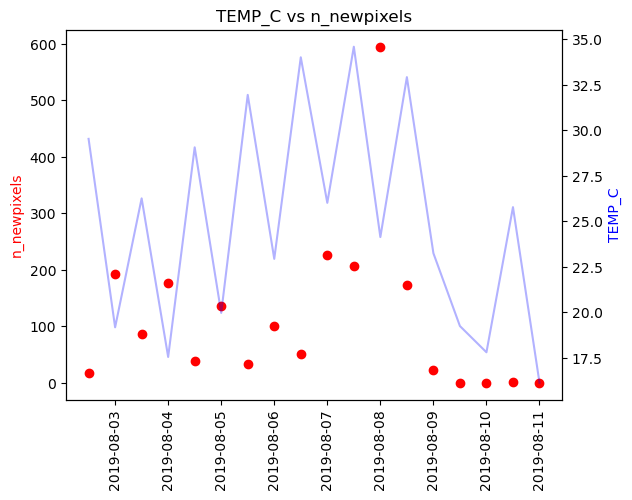

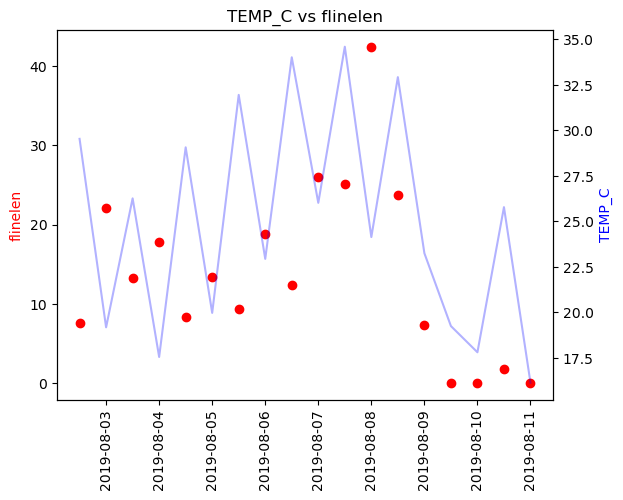

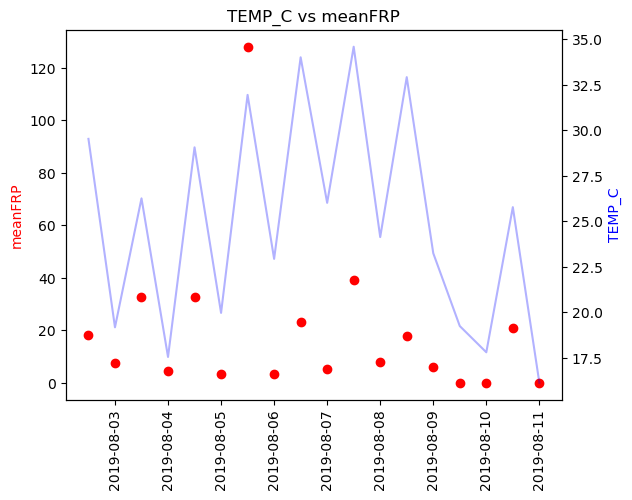

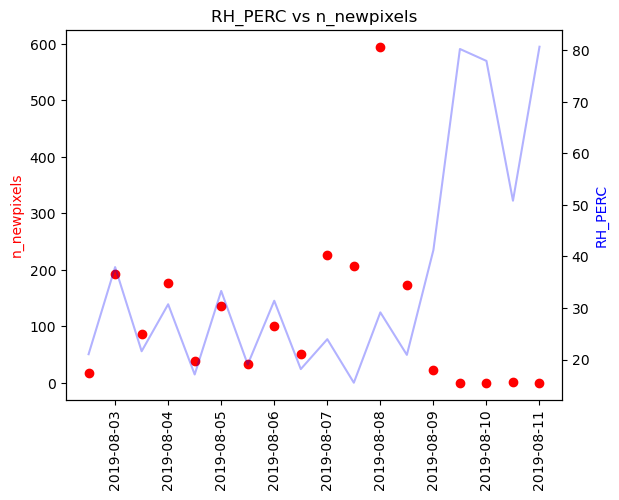

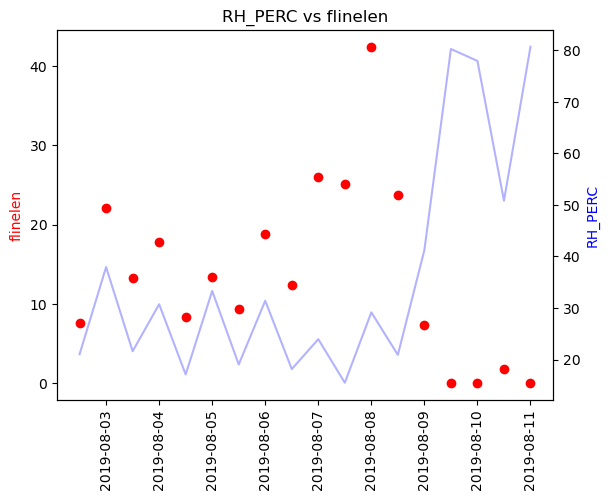

...

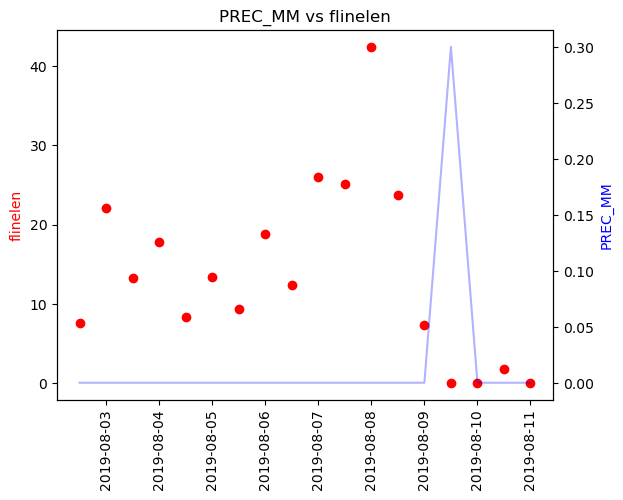

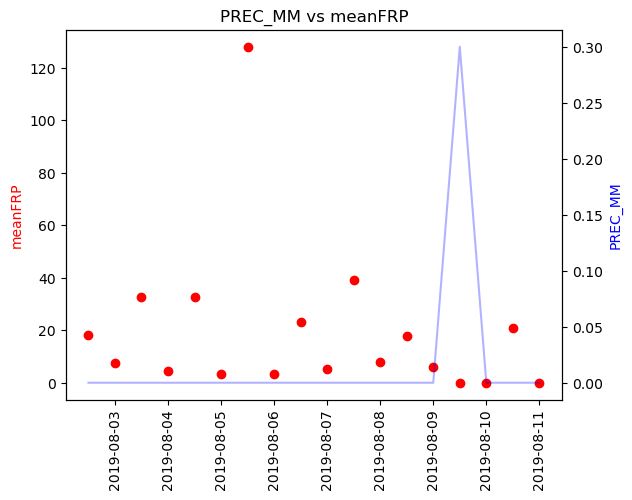

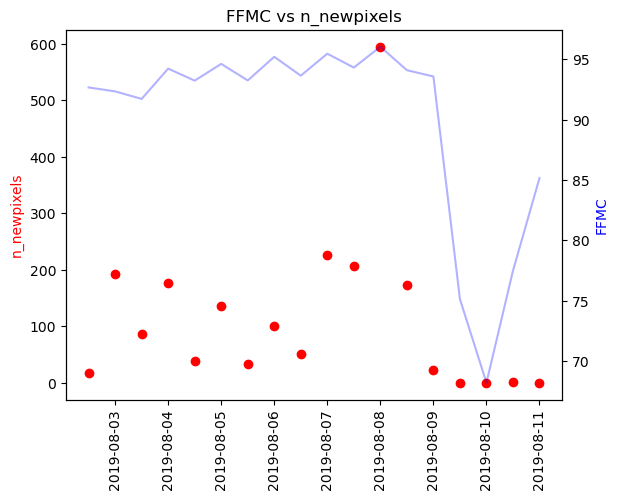

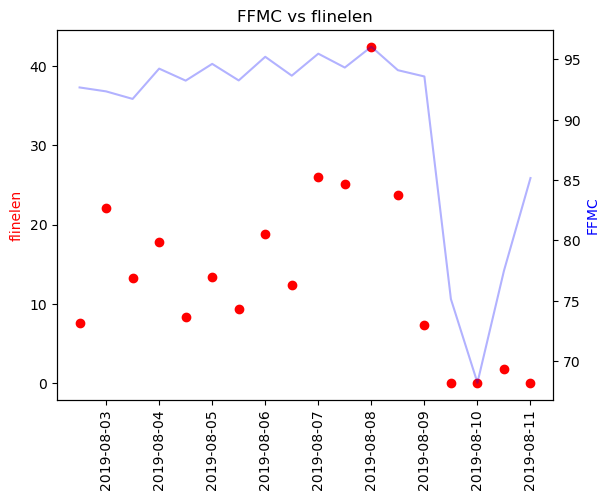

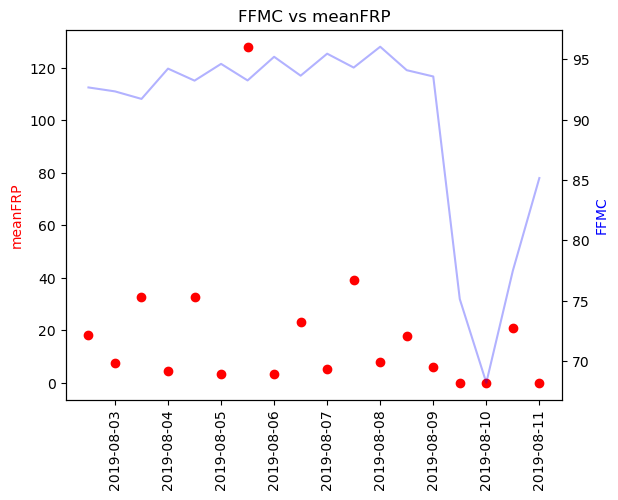

In [86]:
## Try GLM
#glm_binom = sm.GLM(data.endog, data.exog, family=sm.families.Binomial())
tmp = exp[exp.flinelen.isin(exp.flinelen.dropna())]
print(tmp.columns)
exo = tmp[['TEMP_C', 'RH_PERC', ' VPD_HPA', 'WDSPD_KPH', 'PREC_MM',
       'SNOWD_M', 'FFMC', 'ISI', 'FWI']]

exo_small = tmp[[' VPD_HPA', 'WDSPD_KPH', 'PREC_MM']]

met = ['TEMP_C', 'RH_PERC', ' VPD_HPA', 'WDSPD_KPH',
       'FWI', 'PREC_MM', 'FFMC']  ## Station Data Columns to Plot
fire = [ 'n_newpixels', 'flinelen','meanFRP',] ## gdf columns to plot

#n_met = len(met)
#n_fire = len(fire)

for m in met:
    for f in fire:
        fig, ax = plt.subplots()
        
        ax.scatter(tmp["t"], tmp[f], color = "r")
        #ax.plot(full_fr["t"], full_fr[m])
        #plt.xticks(rotation = 90)   
        ax.set_title(m + " vs " +  f)
        ax.set_ylabel(f, color = "red")
        ax2=ax.twinx()
        ax2.plot(tmp["t"], tmp[m],color="blue",  alpha=0.3)
        ax2.set_ylabel(m,color="blue")
        ax.tick_params(axis='x', labelrotation = 90)

        plt.show()

In [78]:
glm = sm.GLM(tmp.flinelen, exo )# ,family=sm.families.Binomial()
glm_2 = sm.GLM(tmp.flinelen, exo_small )
res = glm.fit()
res2 = glm_2.fit()
print(res.summary())
print('Parameters: ', res.params)
print('T-values: ', res.tvalues)


                 Generalized Linear Model Regression Results                  
Dep. Variable:               flinelen   No. Observations:                   18
Model:                            GLM   Df Residuals:                       10
Model Family:                Gaussian   Df Model:                            7
Link Function:               identity   Scale:                          71.044
Method:                          IRLS   Log-Likelihood:                -58.621
Date:                Mon, 07 Nov 2022   Deviance:                       710.44
Time:                        18:18:12   Pearson chi2:                     710.
No. Iterations:                     3   Pseudo R-squ. (CS):             0.7211
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
TEMP_C        -0.6500      1.883     -0.345      0.7

In [79]:
print(res2.summary())
print('Parameters: ', res2.params)
print('T-values: ', res2.tvalues)


                 Generalized Linear Model Regression Results                  
Dep. Variable:               flinelen   No. Observations:                   18
Model:                            GLM   Df Residuals:                       15
Model Family:                Gaussian   Df Model:                            2
Link Function:               identity   Scale:                          127.49
Method:                          IRLS   Log-Likelihood:                -67.533
Date:                Mon, 07 Nov 2022   Deviance:                       1912.4
Time:                        18:18:13   Pearson chi2:                 1.91e+03
No. Iterations:                     3   Pseudo R-squ. (CS):             0.1162
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
 VPD_HPA       0.4221      0.146      2.893      0.0

In [84]:
res2.pvalues

 VPD_HPA     0.003810
WDSPD_KPH    0.308010
PREC_MM      0.643191
dtype: float64